# Gesture Recognizer with MediaPipe Tasks

This notebook shows you how to use MediaPipe Tasks Python API to recognize hand gestures in images.

## Preparation

Let's start with installing MediaPipe.

In [1]:
!pip install -q mediapipe

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 36.1/36.1 MB 16.0 MB/s eta 0:00:00


In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Visualization Utilities

In [14]:
#@markdown We implemented some functions to visualize the gesture recognition results. <br/> Run the following cell to activate the functions.
from matplotlib import pyplot as plt
import mediapipe as mp
from mediapipe.framework.formats import landmark_pb2

plt.rcParams.update({
    'axes.spines.top': False,
    'axes.spines.right': False,
    'axes.spines.left': False,
    'axes.spines.bottom': False,
    'xtick.labelbottom': False,
    'xtick.bottom': False,
    'ytick.labelleft': False,
    'ytick.left': False,
    'xtick.labeltop': False,
    'xtick.top': False,
    'ytick.labelright': False,
    'ytick.right': False
})

mp_hands = mp.solutions.hands
mp_drawing = mp.solutions.drawing_utils
mp_drawing_styles = mp.solutions.drawing_styles


def display_one_image(image, title, subplot, titlesize=16):
    """Displays one image along with the predicted category name and score."""
    plt.subplot(*subplot)
    plt.imshow(image)
    if len(title) > 0:
        plt.title(title, fontsize=int(titlesize), color='black', fontdict={'verticalalignment':'center'}, pad=int(titlesize/1.5))
    return (subplot[0], subplot[1], subplot[2]+1)


def display_batch_of_images_with_gestures_and_hand_landmarks(images, results):
    """Displays a batch of images with the gesture category and its score along with the hand landmarks."""
    # Images and labels.
    images = [image.numpy_view() for image in images]
    gestures = [top_gesture for (top_gesture, _) in results]
    multi_hand_landmarks_list = [multi_hand_landmarks for (_, multi_hand_landmarks) in results]

    # Auto-squaring: this will drop data that does not fit into square or square-ish rectangle.
    rows = int(math.sqrt(len(images)))
    cols = len(images) // rows

    # Size and spacing.
    FIGSIZE = 13.0
    SPACING = 0.1
    subplot=(rows,cols, 1)
    if rows < cols:
        plt.figure(figsize=(FIGSIZE,FIGSIZE/cols*rows))
    else:
        plt.figure(figsize=(FIGSIZE/rows*cols,FIGSIZE))

    # Display gestures and hand landmarks.
    for i, (image, gestures) in enumerate(zip(images[:rows*cols], gestures[:rows*cols])):
        title = f"{gestures.category_name} ({gestures.score:.2f})"
        dynamic_titlesize = FIGSIZE*SPACING/max(rows,cols) * 40 + 3
        annotated_image = image.copy()

        for hand_landmarks in multi_hand_landmarks_list[i]:
          hand_landmarks_proto = landmark_pb2.NormalizedLandmarkList()
          hand_landmarks_proto.landmark.extend([
            landmark_pb2.NormalizedLandmark(x=landmark.x, y=landmark.y, z=landmark.z) for landmark in hand_landmarks
          ])

          mp_drawing.draw_landmarks(
            annotated_image,
            hand_landmarks_proto,
            mp_hands.HAND_CONNECTIONS,
            mp_drawing_styles.get_default_hand_landmarks_style(),
            mp_drawing_styles.get_default_hand_connections_style())

        subplot = display_one_image(annotated_image, title, subplot, titlesize=dynamic_titlesize)

    # Layout.
    plt.tight_layout()
    plt.subplots_adjust(wspace=SPACING, hspace=SPACING)
    plt.show()

Create `IMAGE_FILENAMES` list that contains the names of test images

In [20]:
import os

def create_image_filenames_list(folder_path):
    # Initialize an empty list to store the image filenames
    IMAGE_FILENAMES = []

    # Iterate through the files in the given folder
    for filename in os.listdir(folder_path):
        file_path = os.path.join(folder_path, filename)

        # Check if the current item is a file (not a directory)
        if os.path.isfile(file_path):
            # Append the filename to the list
            IMAGE_FILENAMES.append(filename)

    return IMAGE_FILENAMES

# Example usage:
folder_path = '/content/drive/MyDrive/project1/Arsl_test_samples'
IMAGE_FILENAMES = create_image_filenames_list(folder_path)

# Output the list of filenames
print("List of IMAGE_FILENAMES:", IMAGE_FILENAMES)
print("Number of images:", len(IMAGE_FILENAMES))


List of IMAGE_FILENAMES: ['12-Seen.jpg', '30-Teh_Marbuta.jpg', '27-Waw.jpg', '8-Dal.jpg', '26-Heh.jpg', '14-Sad.jpg', '1-Alef.jpg', '25-Noon.jpg', '17-Zah.jpg', '16-Tah.jpg', '15-Dad.jpg', '23-Lam.jpg', '10-Reh.jpg', '5-Jeem.jpg', '6-Hah.jpg', '4-Theh.jpg', '13-Sheen.jpg', '3-Teh.jpg', '11-Zain.jpg', '2-Beh.jpg', '28-Yeh.jpg', '20-Feh.jpg', '29-Al.jpg', '24-Meem.jpg', '7-Khah.jpg', '18-Ain.jpg', '9-Thal.jpg', '19-Ghain.jpg', '21-Qaf.jpg', '22-Kaf.jpg']
Number of images: 30


Sort the `IMAGE_FILENAMES` List

In [22]:
import re

# Sort the IMAGE_FILENAMES list based on the numeric prefix in each filename
IMAGE_FILENAMES.sort(key=lambda x: int(re.match(r'(\d+)-', x).group(1)))

# Print the sorted list
print("Sorted IMAGE_FILENAMES:", IMAGE_FILENAMES)


Sorted IMAGE_FILENAMES: ['1-Alef.jpg', '2-Beh.jpg', '3-Teh.jpg', '4-Theh.jpg', '5-Jeem.jpg', '6-Hah.jpg', '7-Khah.jpg', '8-Dal.jpg', '9-Thal.jpg', '10-Reh.jpg', '11-Zain.jpg', '12-Seen.jpg', '13-Sheen.jpg', '14-Sad.jpg', '15-Dad.jpg', '16-Tah.jpg', '17-Zah.jpg', '18-Ain.jpg', '19-Ghain.jpg', '20-Feh.jpg', '21-Qaf.jpg', '22-Kaf.jpg', '23-Lam.jpg', '24-Meem.jpg', '25-Noon.jpg', '26-Heh.jpg', '27-Waw.jpg', '28-Yeh.jpg', '29-Al.jpg', '30-Teh_Marbuta.jpg']


Then let's check out the images.

Processing 1-Alef.jpg


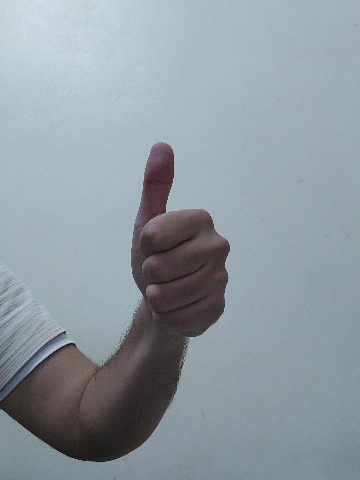

Processing 2-Beh.jpg


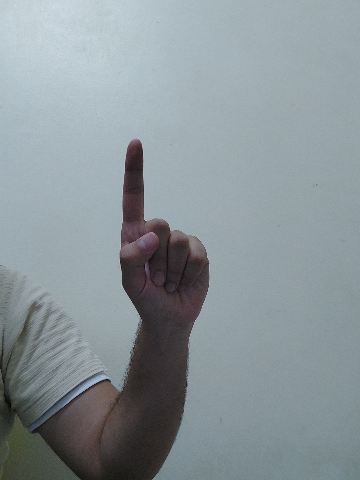

Processing 3-Teh.jpg


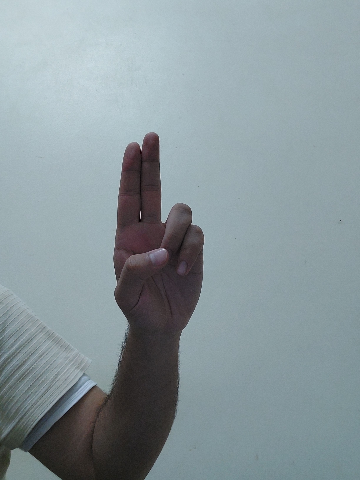

Processing 4-Theh.jpg


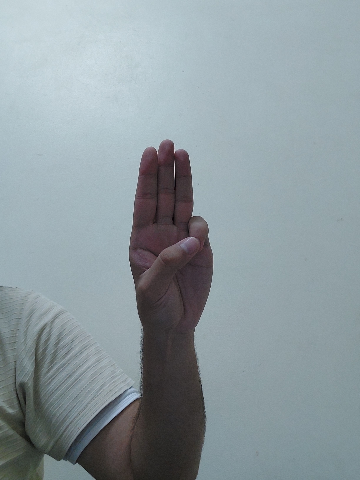

Processing 5-Jeem.jpg


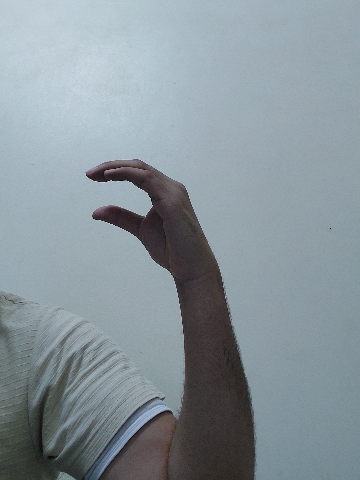

Processing 6-Hah.jpg


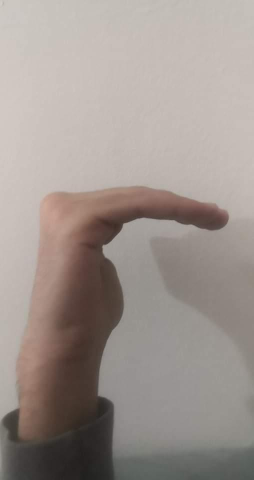

Processing 7-Khah.jpg


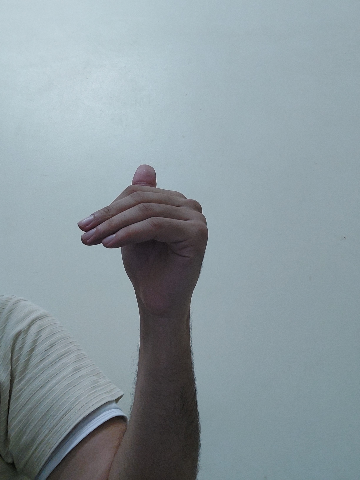

Processing 8-Dal.jpg


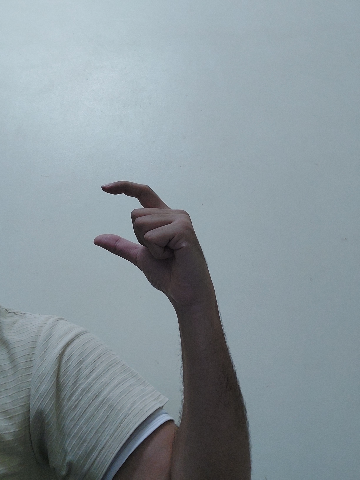

Processing 9-Thal.jpg


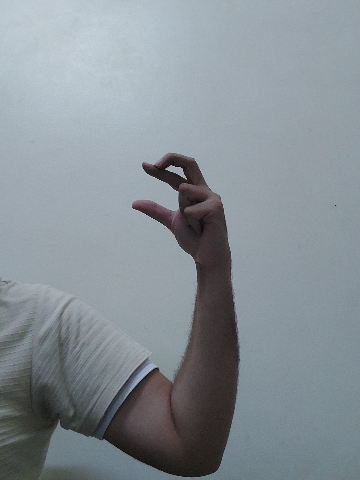

Processing 10-Reh.jpg


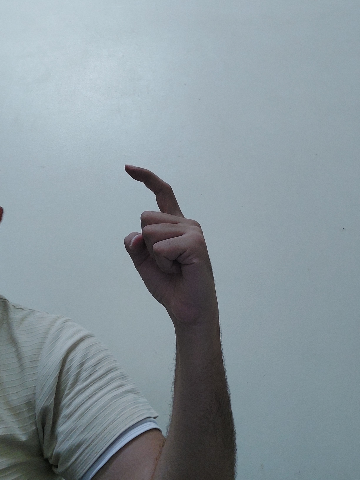

Processing 11-Zain.jpg


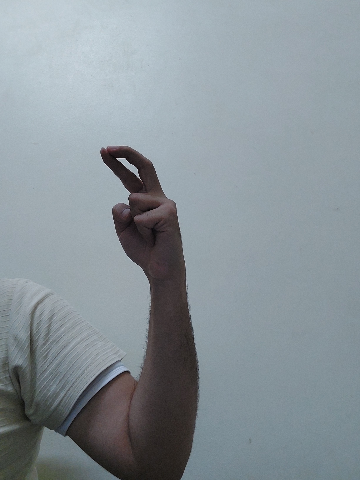

Processing 12-Seen.jpg


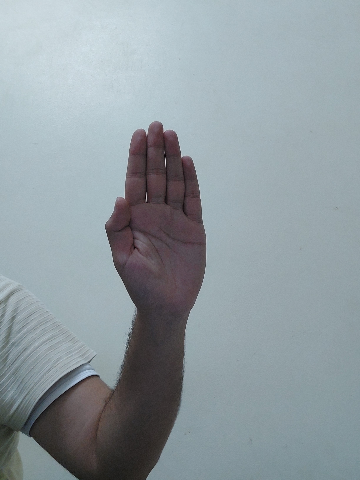

Processing 13-Sheen.jpg


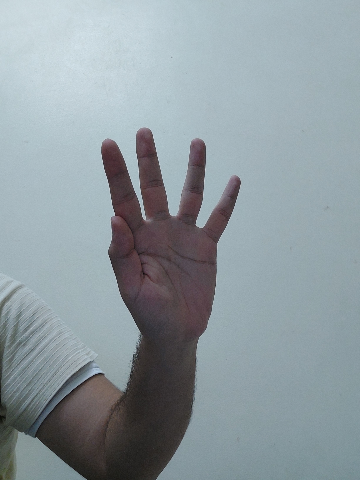

Processing 14-Sad.jpg


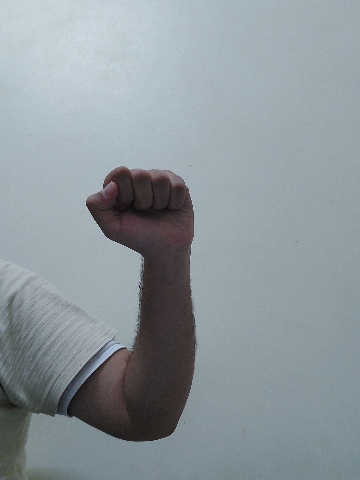

Processing 15-Dad.jpg


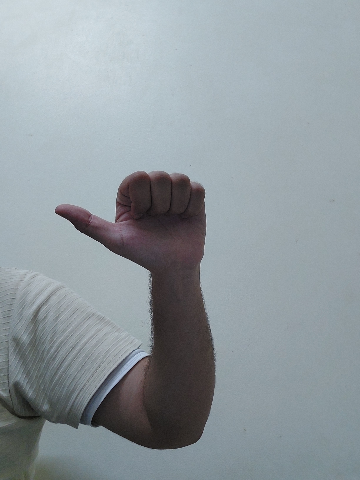

Processing 16-Tah.jpg


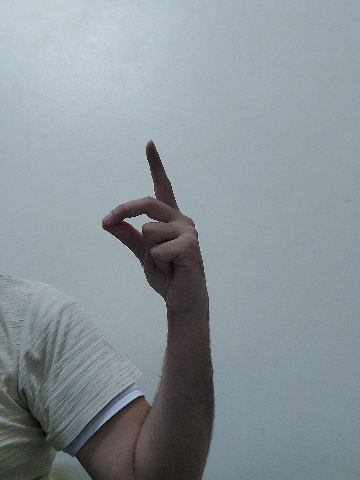

Processing 17-Zah.jpg


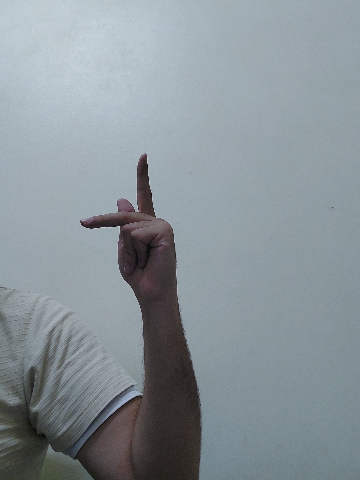

Processing 18-Ain.jpg


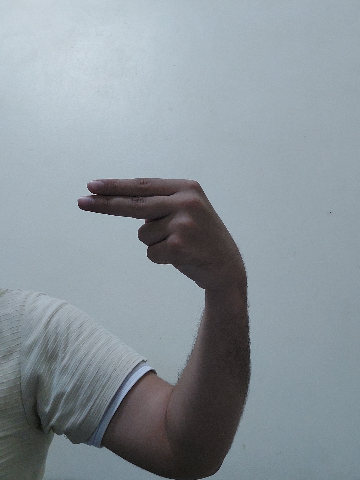

Processing 19-Ghain.jpg


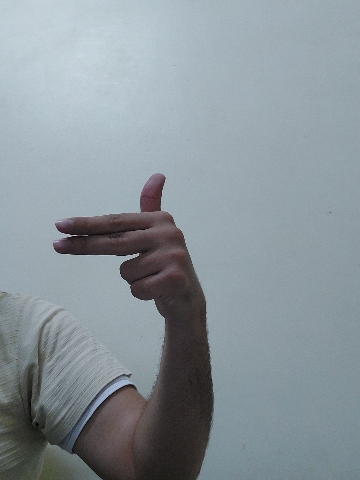

Processing 20-Feh.jpg


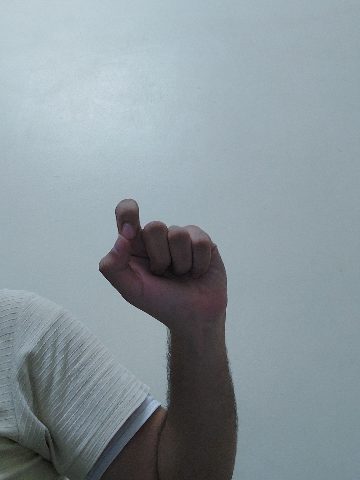

Processing 21-Qaf.jpg


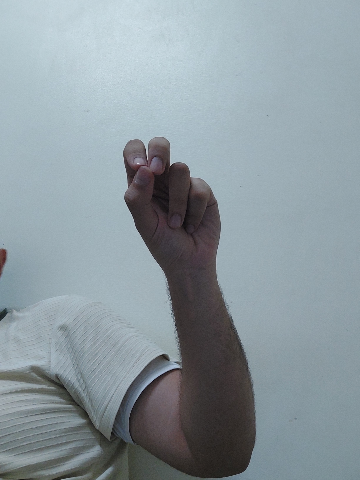

Processing 22-Kaf.jpg


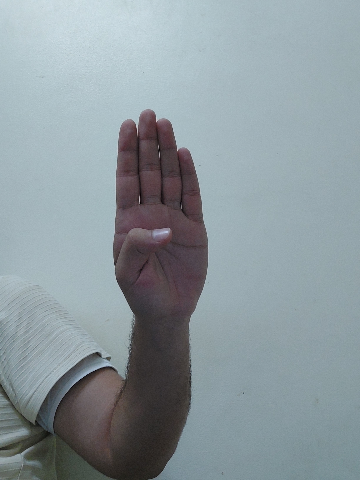

Processing 23-Lam.jpg


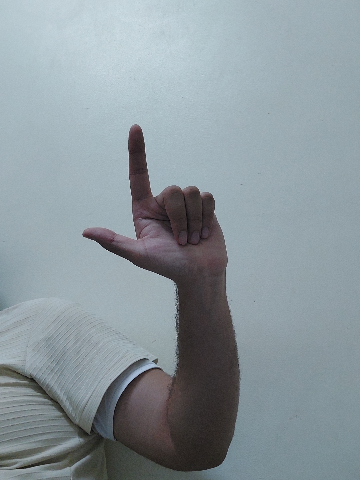

Processing 24-Meem.jpg


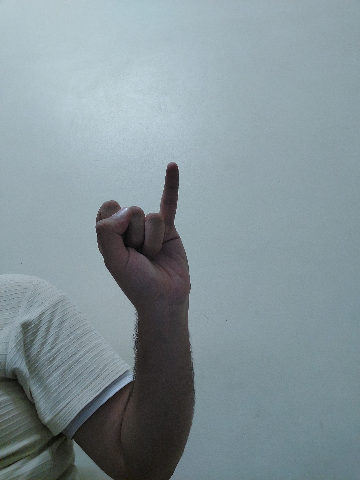

Processing 25-Noon.jpg


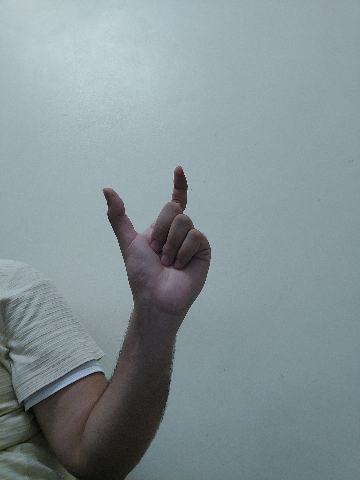

Processing 26-Heh.jpg


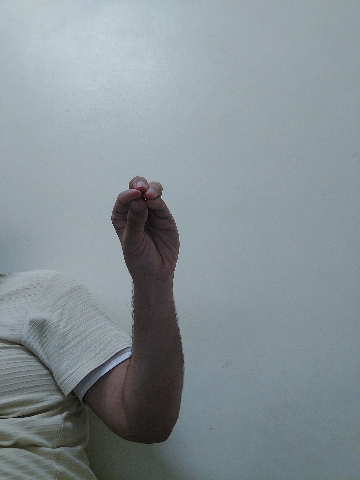

Processing 27-Waw.jpg


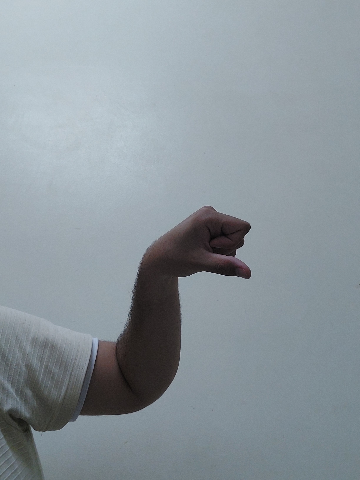

Processing 28-Yeh.jpg


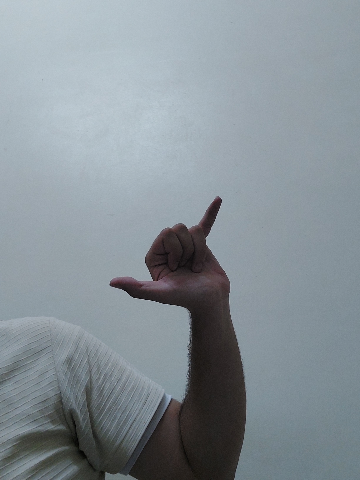

Processing 29-Al.jpg


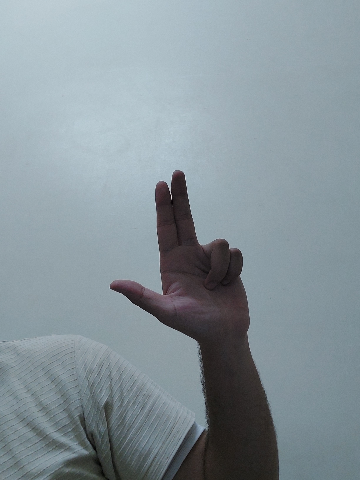

Processing 30-Teh_Marbuta.jpg


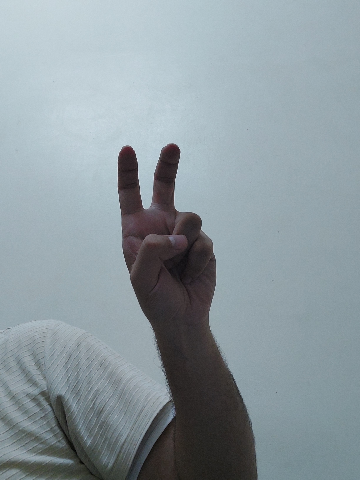

In [46]:
import cv2
from google.colab.patches import cv2_imshow
import math
import os

DESIRED_HEIGHT = 480
DESIRED_WIDTH = 480

def resize_and_show(image):
    # Ensure the image is valid (not None)
    if image is not None:
        h, w = image.shape[:2]
        if h < w:
            img = cv2.resize(image, (DESIRED_WIDTH, math.floor(h/(w/DESIRED_WIDTH))))
        else:
            img = cv2.resize(image, (math.floor(w/(h/DESIRED_HEIGHT)), DESIRED_HEIGHT))
        cv2_imshow(img)
    else:
        print("Error: Image is not valid.")

# Define the folder path where images are located
folder_path = '/content/drive/MyDrive/project1/Arsl_test_samples'

# Preview the images.
images = {name: cv2.imread(os.path.join(folder_path, name)) for name in IMAGE_FILENAMES}
for name, image in images.items():
    print(f"Processing {name}")
    resize_and_show(image)


## Running inference and visualizing the results

Here are the steps to run gesture recognizer using MediaPipe.

Check out the [MediaPipe documentation](https://developers.google.com/mediapipe/solutions/vision/gesture_recognizer/python) to learn more about configuration options that this solution supports.

*Note: Gesture Recognizer also returns the hand landmark it detects from the image, together with other useful information such as whether the hand(s) detected are left hand or right hand.*

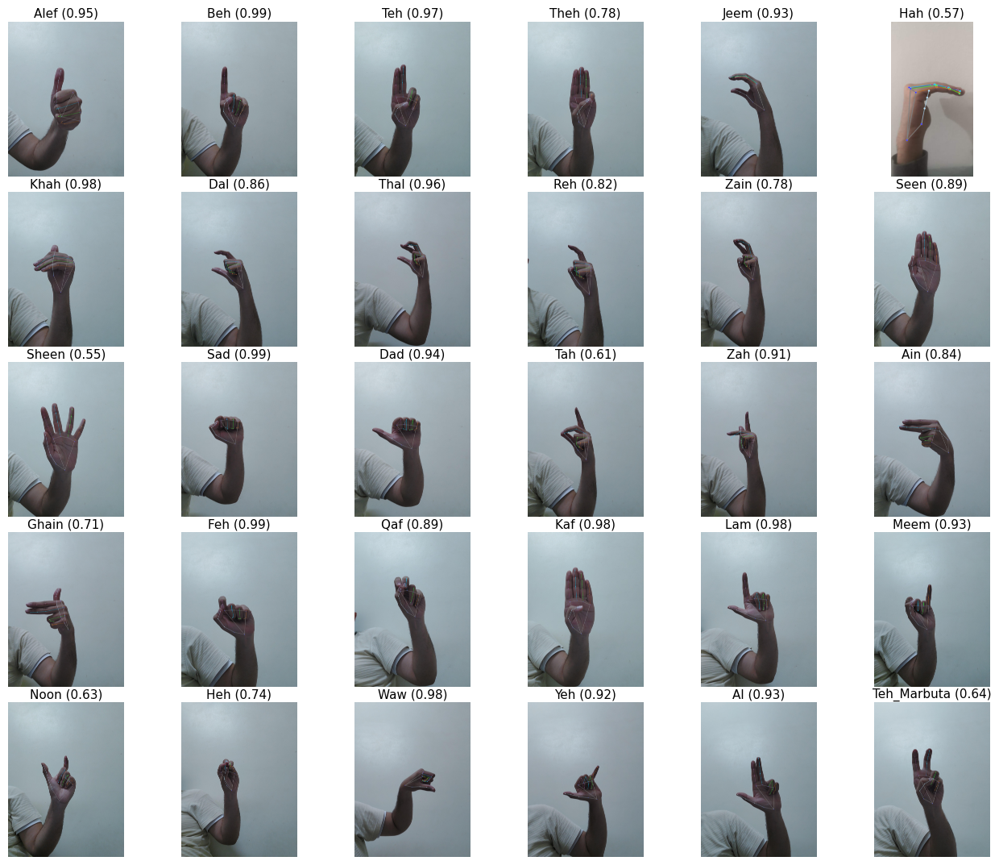

In [45]:
import mediapipe as mp
from mediapipe.tasks import python
from mediapipe.tasks.python import vision
from PIL import Image as PILImage, ExifTags
import os
import tempfile

# STEP 1: Initialize MediaPipe Gesture Recognizer
base_options = python.BaseOptions(model_asset_path='/content/drive/MyDrive/project1/Arsl_gesture_recognizer.task')
options = vision.GestureRecognizerOptions(base_options=base_options)
recognizer = vision.GestureRecognizer.create_from_options(options)

# Define the folder path where the images are located
folder_path = '/content/drive/MyDrive/project1/Arsl_test_samples'

# Temporary folder to save corrected images
temp_folder = tempfile.mkdtemp()

# List to store images and results
images = []
results = []

# STEP 2: Process each image file
for image_file_name in IMAGE_FILENAMES:
    # STEP 3: Construct the full image path
    full_image_path = os.path.join(folder_path, image_file_name)

    # Check if the image exists before trying to load it
    if not os.path.exists(full_image_path):
        print(f"Error: Image {full_image_path} not found!")
        continue

    # STEP 4: Load the input image and fix orientation based on EXIF data
    try:
        pil_image = PILImage.open(full_image_path)

        # Check and apply the correct orientation from EXIF metadata if available
        try:
            exif_data = pil_image._getexif()
            if exif_data is not None:
                for tag, value in exif_data.items():
                    if ExifTags.TAGS.get(tag) == 'Orientation':
                        if value == 3:
                            pil_image = pil_image.rotate(180, expand=True)
                        elif value == 6:
                            pil_image = pil_image.rotate(270, expand=True)
                        elif value == 8:
                            pil_image = pil_image.rotate(90, expand=True)
        except (AttributeError, KeyError, IndexError):
            # No EXIF data found or the image doesn't contain orientation info
            pass

        # Save the corrected image to the temporary folder
        temp_image_path = os.path.join(temp_folder, image_file_name)
        pil_image.save(temp_image_path)

        # Now load the image into MediaPipe
        image = mp.Image.create_from_file(temp_image_path)
    except Exception as e:
        print(f"Error loading image {full_image_path}: {e}")
        continue

    # STEP 5: Recognize gestures in the input image
    recognition_result = recognizer.recognize(image)

    # STEP 6: Process the result
    images.append(image)
    top_gesture = recognition_result.gestures[0][0]
    hand_landmarks = recognition_result.hand_landmarks
    results.append((top_gesture, hand_landmarks))

# STEP 7: Display results
if images:
    display_batch_of_images_with_gestures_and_hand_landmarks(images, results)
else:
    print("No images to display due to loading or processing errors.")
